# Midterm assigment
**Image enhancement** is the process of improving the visual quality of an image by adjusting its characteristics, such as contrast, brightness, or color balance. Image enhancement techniques can be used to emphasize certain features, correct for poor lighting conditions, or simply make an image more aesthetically pleasing.

In this assignment, students will implement different image enhancement techniques using Python and OpenCV to gain a deeper understanding of how these methods work and their applications in real-world scenarios.

The assignment can be structured as follows:

1. Load an image: The first step is to load an image into the code using a library such as OpenCV or Pillow. The image should have some room for improvement in terms of brightness, contrast, or color balance.

2. Histogram equalization: Apply histogram equalization to improve the contrast of the image. Use cv2.equalizeHist() for grayscale images or apply it to each color channel separately for color images. Plot the equalized image alongside the original image using a plotting library such as Matplotlib.

3. Contrast stretching: Implement a contrast stretching function that rescales the pixel intensities in the image to a desired range, such as [0, 255]. Apply the function to the image and plot the contrast-stretched image alongside the original and equalized images.

4. Adaptive histogram equalization: Apply adaptive histogram equalization using the Contrast Limited Adaptive Histogram Equalization (CLAHE) method in OpenCV (cv2.createCLAHE()). Compare the results with global histogram equalization and plot the adaptively equalized image.

5. Color balance: Implement a color balance correction function that adjusts the color channels in the image to remove color casts (e.g., due to poor lighting conditions). One approach is to scale the intensities in each channel so that they have the same mean or median value. Apply the function to the image and plot the color-balanced image alongside the other enhanced images.

By completing this assignment, students can gain hands-on experience with various image enhancement techniques and learn how to apply these methods to improve the visual quality of digital images.

### 1. Histogram equalization



In [1]:
from google.colab import files
uploaded = files.upload()

Saving DCT1203_3120410256.jpg to DCT1203_3120410256.jpg


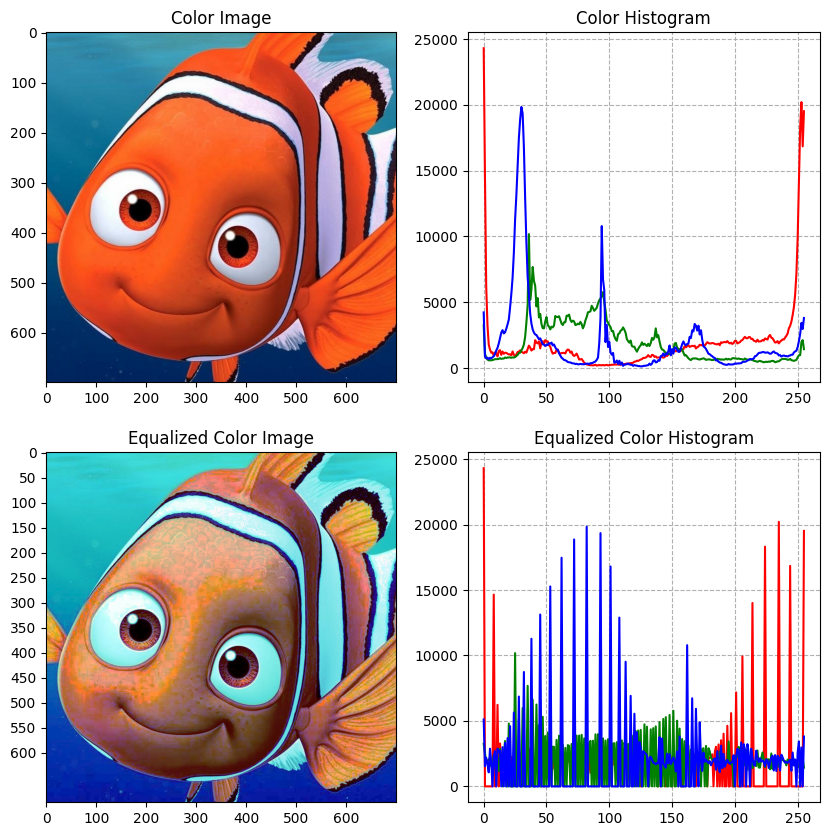

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
color_img = cv2.imread('DCT1203_3120410256.jpg')
#color_img = cv2.imread('img.jpg')
#color_img = cv2.imread('img.jpg')
# Split the image into its color channels
b, g, r = cv2.split(color_img)

# Compute the histograms for each color channel
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])

# Apply histogram equalization to each channel
eq_b = cv2.equalizeHist(b)
eq_g = cv2.equalizeHist(g)
eq_r = cv2.equalizeHist(r)

# Merge the equalized channels back into a color image
equalized_color_img = cv2.merge((eq_b, eq_g, eq_r))

# Compute the histograms for each channel of the equalized image
equalized_hist_r = cv2.calcHist([eq_r], [0], None, [256], [0, 256])
equalized_hist_g = cv2.calcHist([eq_g], [0], None, [256], [0, 256])
equalized_hist_b = cv2.calcHist([eq_b], [0], None, [256], [0, 256])

# Plot the original color image, its histogram, the equalized color image, and its histogram
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axes[1, 0].set_yticks(np.arange(0, 600+1, 50))
axes[0, 0].imshow(cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Color Image')

axes[0, 1].plot(hist_r, color='r')
axes[0, 1].plot(hist_g, color='g')
axes[0, 1].plot(hist_b, color='b')
axes[0, 1].set_title('Color Histogram')
axes[0, 1].set_axisbelow(True)
axes[0, 1].grid(True, linestyle='--', zorder=0)
axes[1, 0].imshow(cv2.cvtColor(equalized_color_img, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Equalized Color Image')

axes[1, 1].plot(equalized_hist_r, color='r')
axes[1, 1].plot(equalized_hist_g, color='g')
axes[1, 1].plot(equalized_hist_b, color='b')
axes[1, 1].set_title('Equalized Color Histogram')
axes[1, 1].grid(True, linestyle='--', zorder=0)
axes[1, 1].set_axisbelow(True)

- Ảnh sau khi chỉnh sửa thì vùng tối trở nên tối hơn đồng thời vùng sáng trở nên sáng hơn tuy nhiên, màu sắc không được cân đối. Vùng ảnh vị trí mắt cá và vây cá của bức ảnh lúc sau có hơi ngả sang xanh so với màu trắng ở bức ảnh lúc đầu. Chứng tỏ kênh B đang có cường độ cao hơn 2 kênh còn lại do màu trắng được tạo thành là do sự kết hợp của 3 kênh R, G, B.

=> Do các kênh màu trong bức ảnh phải có sự phối hợp cường độ với nhau để màu sắc bức ảnh được hài hòa. Do đó, việc cân bằng riêng lẻ từng kênh màu làm cho cường độ các kênh màu thay đổi khác nhau dẫn đến sự cân đối về màu sắc của bức ảnh bị mất đi. Dẫn đến ảnh sau khi tăng cường cho kết quả không được tốt.

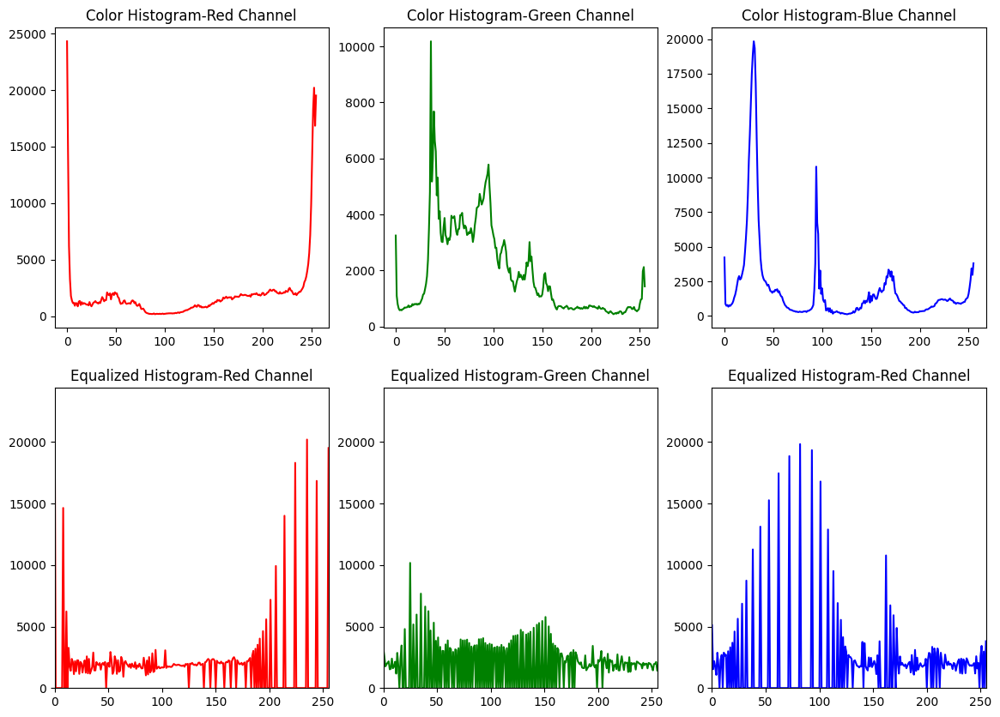

In [3]:
# Compute the histograms for each color channel
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

axs[0, 0].plot(hist_r, color='r')
axs[0, 0].set_title('Color Histogram-Red Channel')
axs[0, 1].plot(hist_g, color='g')
axs[0, 1].set_title('Color Histogram-Green Channel')
axs[0, 2].plot(hist_b, color='b')
axs[0, 2].set_title('Color Histogram-Blue Channel')

axs[1, 0].plot(equalized_hist_r, color='red')
axs[1, 0].set_xlim([0, 255])
axs[1, 0].set_ylim([0, max(max(equalized_hist_r), max(equalized_hist_g), max(equalized_hist_b)) + 100])
axs[1, 0].set_title('Equalized Histogram-Red Channel')


axs[1, 1].plot(equalized_hist_g, color='green')
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, max(max(equalized_hist_r), max(equalized_hist_g), max(equalized_hist_b)) + 100])
axs[1, 1].set_title('Equalized Histogram-Green Channel')

axs[1, 2].plot(equalized_hist_b, color='blue')
axs[1, 2].set_xlim([0, 255])
axs[1, 2].set_ylim([0, max(max(equalized_hist_r), max(equalized_hist_g), max(equalized_hist_b)) + 100])
axs[1, 2].set_title('Equalized Histogram-Red Channel')
plt.show()

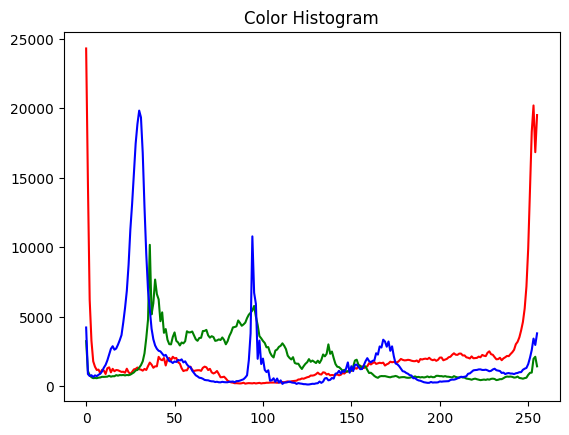

In [ ]:
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])

plt.plot(hist_r, color='r')
plt.plot(hist_g, color='g')
#plt.set_xlim([0, 255])
#plt.set_ylim([0, max(max(equalized_hist_r), max(equalized_hist_g), max(equalized_hist_b)) + 100])
#plt.title('Equalized Histogram-Green Channel')

plt.plot(hist_b, color='b')
#plt.set_xlim([0, 255])
#plt.set_ylim([0, max(max(equalized_hist_r), max(equalized_hist_g), max(equalized_hist_b)) + 100])
plt.title('Color Histogram')
plt.show()

- Có thể thấy histogram của cả 3 kênh màu lúc đầu có đỉnh nằm ở góc trái - nơi có giá trị cường độ thấp nhưng sau khi tiến hành tăng cường bằng phương pháp Histogram Equalization thì các đỉnh có xu hướng dịch chuyển về về phía bên phải - vị trí có cường độ cao hơn. Do đó ảnh sau khi tăng cường sáng hơn ảnh lúc đầu.

- Sau khi tăng cường thì ở histogram của 3 kênh màu xuất hiện các rãnh trắng- đó chính là các giá trị bị mất đi khi kéo dãn biểu đồ.

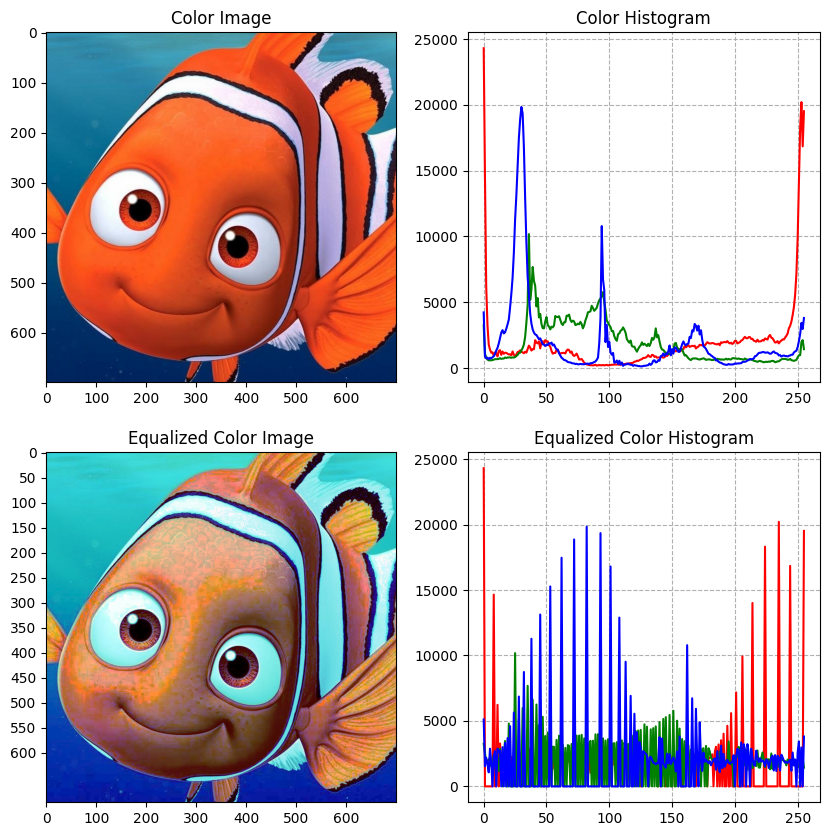

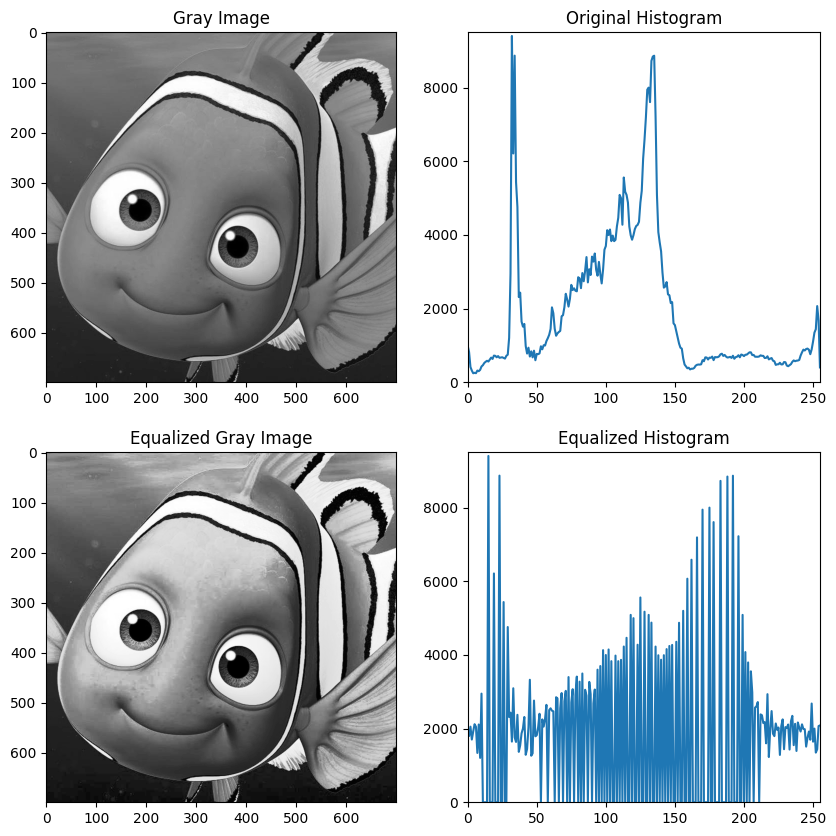

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
color_img = cv2.imread('DCT1203_3120410256.jpg')
# Split the image into its color channels
b, g, r = cv2.split(color_img)

# Compute the histograms for each color channel
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])

# Apply histogram equalization to each channel
eq_b = cv2.equalizeHist(b)
eq_g = cv2.equalizeHist(g)
eq_r = cv2.equalizeHist(r)

# Merge the equalized channels back into a color image
equalized_color_img = cv2.merge((eq_b, eq_g, eq_r))

# Compute the histograms for each channel of the equalized image
equalized_hist_r = cv2.calcHist([eq_r], [0], None, [256], [0, 256])
equalized_hist_g = cv2.calcHist([eq_g], [0], None, [256], [0, 256])
equalized_hist_b = cv2.calcHist([eq_b], [0], None, [256], [0, 256])

# Plot the original color image, its histogram, the equalized color image, and its histogram
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axes[1, 0].set_yticks(np.arange(0, 600+1, 50))
axes[0, 0].imshow(cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Color Image')

axes[0, 1].plot(hist_r, color='r')
axes[0, 1].plot(hist_g, color='g')
axes[0, 1].plot(hist_b, color='b')
axes[0, 1].set_title('Color Histogram')
axes[0, 1].set_axisbelow(True)
axes[0, 1].grid(True, linestyle='--', zorder=0)
axes[1, 0].imshow(cv2.cvtColor(equalized_color_img, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Equalized Color Image')

axes[1, 1].plot(equalized_hist_r, color='r')
axes[1, 1].plot(equalized_hist_g, color='g')
axes[1, 1].plot(equalized_hist_b, color='b')
axes[1, 1].set_title('Equalized Color Histogram')
axes[1, 1].grid(True, linestyle='--', zorder=0)
axes[1, 1].set_axisbelow(True)

img1 = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axs[0, 0].imshow(img1, cmap='gray')
axs[0, 0].set_title('Gray Image')
img2=cv2.equalizeHist(img1)
axs[1, 0].imshow(img2, cmap='gray')
axs[1, 0].set_title('Equalized Gray Image')

orig_hist, _ = np.histogram(img1, bins=256, range=(0, 255))
axs[0, 1].plot(orig_hist)
axs[0, 1].set_xlim([0, 255])
axs[0, 1].set_ylim([0, max(orig_hist) + 100])
axs[0, 1].set_title('Original Histogram')

equa_hist, _ = np.histogram(img2, bins=256, range=(0, 255))
axs[1, 1].plot(equa_hist)
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, max(equa_hist) + 100])
axs[1, 1].set_title('Equalized Histogram')

plt.show()

Nếu áp dụng phương pháp Histogram Equalization để cân bằng ảnh xám thì cho kết quả khả quan hơn do ảnh xám chỉ có một kênh màu. 

=> Phương pháp Histogram Equalization khi cân bằng ảnh màu trên không gian màu RGB sẽ làm thay đổi cường độ riêng lẻ từng kênh màu, qua đó thay đổi hình dạng histogram của chúng dẫn đến việc cường độ 3 kênh màu R,G,B không còn phối hợp với nhau hợp lý nên màu sắc của ảnh output không được hài hòa.

Text(0.5, 1.0, 'Equalized Color Image in YUV color space')

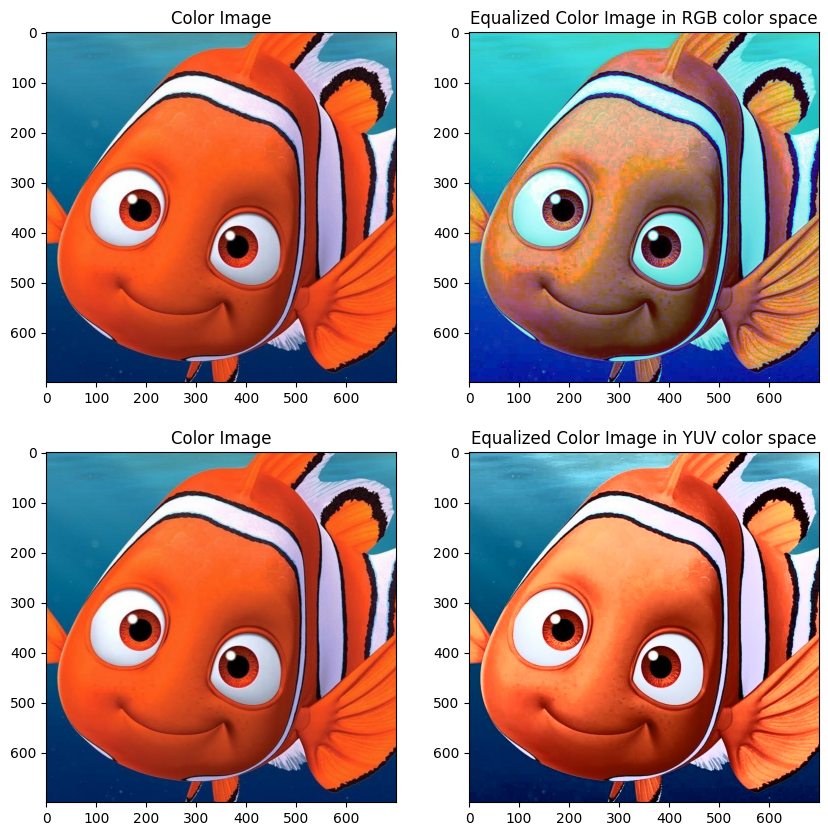

In [15]:
color_img = cv2.imread('DCT1203_3120410256.jpg')
#color_img = cv2.imread('img.jpg')
img_yuv = cv2.cvtColor(color_img, cv2.COLOR_BGR2YUV)
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

# convert the YUV image back to RGB format
img_output1 = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Apply histogram equalization to each channel
eq_b = cv2.equalizeHist(b)
eq_g = cv2.equalizeHist(g)
eq_r = cv2.equalizeHist(r)

# Merge the equalized channels back into a color image
equalized_color_img = cv2.merge((eq_b, eq_g, eq_r))

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
# axes[1, 0].set_yticks(np.arange(0, 600+1, 50))
axes[0, 0].imshow(cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Color Image')

axes[0, 1].imshow(cv2.cvtColor(equalized_color_img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Equalized Color Image in RGB color space')

axes[1, 0].imshow(cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Color Image')

axes[1, 1].imshow(cv2.cvtColor(img_output1, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Equalized Color Image in YUV color space')

Nếu chuyển ảnh từ hệ màu RGB sang hệ màu YUV rồi tăng cường sáng thì sẽ cho kết quả khả quan hơn, ảnh output có màu sắc không bị thay đổi so với ảnh ban đầu, đồng thời độ tương phản cũng được cải thiện, tuy nhiên có một vài chỗ quá sáng so với ảnh ban đầu.

=> Cả 2 trường hợp ảnh xám và ảnh màu sau khi áp dụng Equalized Color Histogram thì vùng sáng trở nên quá sáng, dẫn đến việc độ sáng của ảnh sau khi tăng cường thay đổi so với ảnh ban đầu do đó ảnh output không giữ được cường độ trung bình của ảnh đầu vào gây ra hiệu ứng bão hòa. 



### 2. Contrast stretching

#### 2.1. Color images

In [19]:
def contrast_stretching_color_image(img, a, b, c, d):
    """
    Rescales the pixel intensities in a color image to a desired range using contrast stretching.

    Parameters
    ----------
    img : numpy.ndarray
        The input color image to apply contrast stretching on.
    a : int
        The lower limit of the pixel intensity range that will be stretched.
    b : int
        The upper limit of the pixel intensity range that will be stretched.
    c : int
        The lower limit of the output pixel intensity range.
    d : int
        The upper limit of the output pixel intensity range.

    Returns
    -------
    numpy.ndarray
        The contrast-stretched color image with pixel intensities rescaled to the range [c, d].
    """

    # Initialize the output image with zeros of the same shape as the input image
    stretched_img = np.zeros_like(img)

    # Loop over each color channel in the image
    for channel in range(img.shape[2]):
        pixel_vals = img[:, :, channel]
        # Calculate the new pixel intensities using linear transformation and set them to the output image
        stretched_vals = np.where(pixel_vals < a, c, np.where(pixel_vals > b, d, ((pixel_vals - a) * ((d - c) / (b - a))) + c))
        stretched_img[:, :, channel] = stretched_vals

    return stretched_img

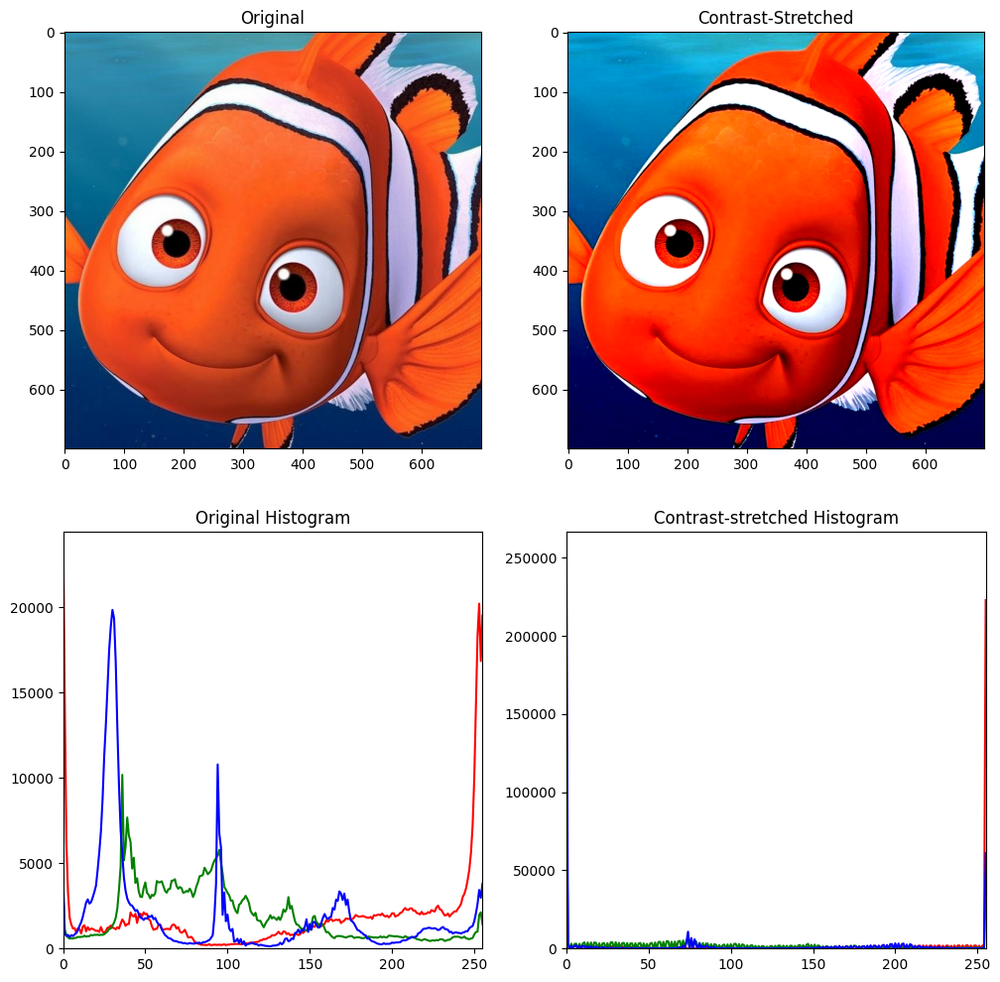

In [21]:
# Load a color image
img = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_COLOR)
#img = cv2.imread('img.jpg', cv2.IMREAD_COLOR)
# Convert the image to RGB for displaying with Matplotlib
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Calculate the histograms of the original and contrast-stretched images
orig_hist_r, _ = np.histogram(img[:, :, 0], bins=256, range=(0, 255))
orig_hist_g, _ = np.histogram(img[:, :, 1], bins=256, range=(0, 255))
orig_hist_b, _ = np.histogram(img[:, :, 2], bins=256, range=(0, 255))

stretched_img = contrast_stretching_color_image(img, 50, 200, 0, 255)
# stretched_img = contrast_stretching_color_image(img, 50, 250, 0, 255)
stretched_hist_r, _ = np.histogram(stretched_img[:, :, 0], bins=256, range=(0, 255))
stretched_hist_g, _ = np.histogram(stretched_img[:, :, 1], bins=256, range=(0, 255))
stretched_hist_b, _ = np.histogram(stretched_img[:, :, 2], bins=256, range=(0, 255))

# Plot the images and histograms
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

axs[0, 0].imshow(img)
axs[0, 0].set_title('Original')

axs[0, 1].imshow(stretched_img)
axs[0, 1].set_title('Contrast-Stretched')

axs[1, 0].plot(orig_hist_r, color='red')
axs[1, 0].plot(orig_hist_g, color='green')
axs[1, 0].plot(orig_hist_b, color='blue')
axs[1, 0].set_xlim([0, 255])
axs[1, 0].set_ylim([0, max(max(orig_hist_r), max(orig_hist_g), max(orig_hist_b)) + 100])
axs[1, 0].set_title('Original Histogram')

axs[1, 1].plot(stretched_hist_r, color='red')
axs[1, 1].plot(stretched_hist_g, color='green')
axs[1, 1].plot(stretched_hist_b, color='blue')
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, max(max(stretched_hist_r), max(stretched_hist_g), max(stretched_hist_b)) + 100])
axs[1, 1].set_title('Contrast-stretched Histogram')
plt.show()

- Do ba kênh màu trong Original Histogram không có mối tương quan mạnh với nhau cũng như histogram không nằm ở dạng lưỡng cực do đó, có thể áp dụng phương pháp này để tiến hành tăng cường ảnh.

- Ảnh output có màu đậm hơn so với ảnh input ban đầu, đồng thời bị mất một số chi tiết => Trong quá trình điều chỉnh tham số có dẫn dến mất thông tin.

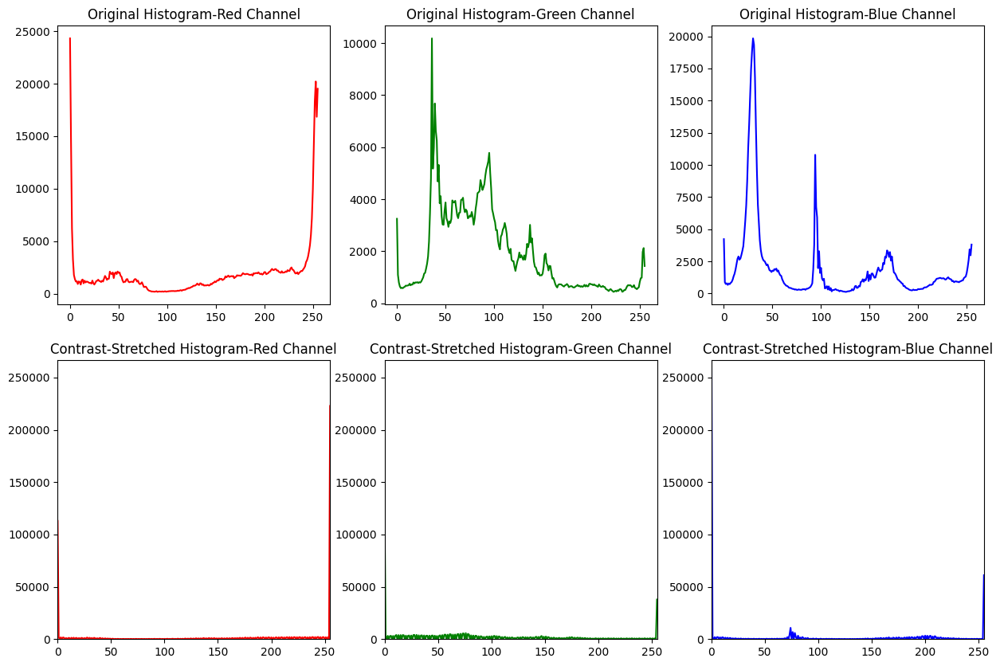

In [22]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

axs[0, 0].plot(orig_hist_r, color='red')
axs[0, 0].set_title('Original Histogram-Red Channel')
axs[0, 1].plot(orig_hist_g, color='green')
axs[0, 1].set_title('Original Histogram-Green Channel')
axs[0, 2].plot(orig_hist_b, color='blue')
axs[0, 2].set_title('Original Histogram-Blue Channel')

axs[1, 0].plot(stretched_hist_r, color='red')
axs[1, 0].set_xlim([0, 255])
axs[1, 0].set_ylim([0, max(max(stretched_hist_r), max(stretched_hist_g), max(stretched_hist_b)) + 100])
axs[1, 0].set_title('Contrast-Stretched Histogram-Red Channel')

axs[1, 1].plot(stretched_hist_g, color='green')
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, max(max(stretched_hist_r), max(stretched_hist_g), max(stretched_hist_b)) + 100])
axs[1, 1].set_title('Contrast-Stretched Histogram-Green Channel')

axs[1, 2].plot(stretched_hist_b, color='blue')
axs[1, 2].set_xlim([0, 255])
axs[1, 2].set_ylim([0, max(max(stretched_hist_r), max(stretched_hist_g), max(stretched_hist_b)) + 100])
axs[1, 2].set_title('Contrast-Stretched Histogram-Blue Channel')

plt.show()

- Do histogram của Red channel của bức ảnh input số pixel có cường độ 0 và 250 chiếm số lượng xấp xỉ 200000, tuy nhiên, qua bức ảnh output thì số pixel có cường độ bằng 0 chỉ chiếm trong khoảng hơn 100000 một tí ngược lại số pixel có cường độ bằng 250 tăng lên gần 25000 pixel. Do đó, ở những vị trí có màu đỏ trên bức ảnh output sáng hơn so với bức ảnh ban đầu.

- Do histogram của Blue channel của bức ảnh ban đầu, số pixel có cường độ từ 0 đến 50 chiếm khá lớn gần 20000 pixel, ngoài ra các cường độ từ 75 đến 100 hay 125 đến 200 cũng chiếm một lượng lớn pixel,cường độ 250 có số pixel ít hơn so với các giá trị còn lại. Tuy nhiên, sau khi tăng cường ảnh thì số pixel có cường độ bằng 0 chiếm nhiều nhất, kế đến là số pixel có cường độ là 250. Dẫn đến một số vùng ảnh lúc này chuyển sang tối hơn so với vùng ảnh ban đầu. 

-  Ở histogram của Green channel thì số lượng pixel mang cường độ là 0 và 250 cũng tăng lên sau khi tăng cường.

=> Phương pháp này làm tăng số lượng pixel mang cường độ tối đa và cường độ tối thiểu, làm cho vùng ảnh sáng trở nên sáng hơn đồng thời vùng ảnh tối trở nên tối hơn, qua đó làm tăng độ tương phản của hình ảnh.

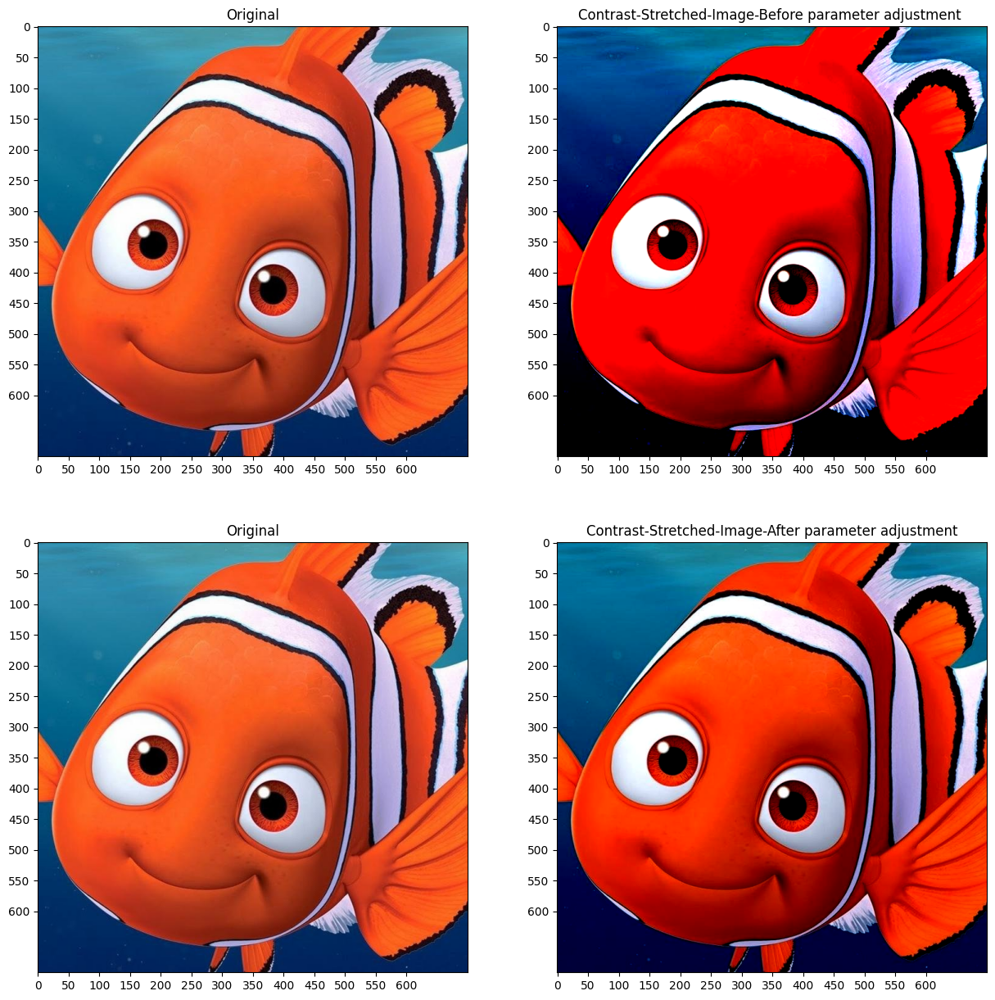

In [27]:
# Load a color image
# img = cv2.imread('/content/drive/MyDrive/Midterm XLA/image.jpg', cv2.IMREAD_COLOR)
img = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_COLOR)
#img = cv2.imread('img.jpg', cv2.IMREAD_COLOR)
# Convert the image to RGB for displaying with Matplotlib
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Calculate the histograms of the original and contrast-stretched images
orig_hist_r, _ = np.histogram(img[:, :, 0], bins=256, range=(0, 255))
orig_hist_g, _ = np.histogram(img[:, :, 1], bins=256, range=(0, 255))
orig_hist_b, _ = np.histogram(img[:, :, 2], bins=256, range=(0, 255))

stretched_img1 = contrast_stretching_color_image(img, 100, 220, 0, 255)
stretched_img = contrast_stretching_color_image(img, 50, 250, 0, 255)


# Plot the images and histograms
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
axs[0, 0].set_yticks(np.arange(0, 600+1, 50))
axs[0, 0].imshow(img)
axs[0, 0].set_title('Original')
axs[0, 0].set_xticks(np.arange(0, 600+1, 50))

axs[0, 1].set_yticks(np.arange(0, 600+1, 50))
axs[0, 1].set_xticks(np.arange(0, 600+1, 50))
axs[0, 1].imshow(stretched_img1)
axs[0, 1].set_title('Contrast-Stretched-Image-Before parameter adjustment ')

# fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
axs[1, 0].set_yticks(np.arange(0, 600+1, 50))
axs[1, 0].imshow(img)
axs[1, 0].set_title('Original')
axs[1, 0].set_xticks(np.arange(0, 600+1, 50))

axs[1, 1].set_yticks(np.arange(0, 600+1, 50))
axs[1, 1].set_xticks(np.arange(0, 600+1, 50))
axs[1, 1].imshow(stretched_img)
axs[1, 1].set_title('Contrast-Stretched-Image-After parameter adjustment')
plt.show()


- Do bức ảnh sau khi chỉnh sửa sáng hơn so với bức ảnh ban đầu nên một số chi tiết của bức ảnh ban đầu không còn được giữ lại, cụ thể là màu sắc của vùng ảnh có chứa tọa độ(300,350) ở bức ảnh ban đầu có hơi tối để biểu thị cho hốc mắt nhưng sau khi tăng cường thay vì làm tối hơn thì bị làm sáng lên giống với các phần khác dẫn đến phần hốc mắt ở bức ảnh lúc sau bị mất một phần so với bức ảnh ban đầu. 

- Sau khi tiến hành điều chỉnh lại tham số đổi giá trị cường độ tối đa từ 200 lên 250 thì bức ảnh sau khi tăng cường không còn bị mất thông tin nữa(vùng tọa độ (300,350) trở nên tối đi chứ không còn sáng lên như khi chưa điều chỉnh tham số nữa).
 
- Do khi hàm contrast_stretching_color_image() biến đổi các giá trị pixel lớn hơn giá trị cường độ tối đa thành 255. Do đó, ở lần đầu giá trị cường độ tối đa là 200 mà các pixel ở vùng hốc mắt có giá trị lớn hơn 200 do đó, cường độ các pixel này được quy về 255 do đó dẫn đến khu vực ảnh đó trở nên sáng lên, sau khi điều chỉnh lên thành 250 cao hơn cường độ các pixel này nên khắc phục được tình trạng này, khu vực hốc mắt không còn sáng lên nữa mà thay vào đó là tối hơn.

- Màu sắc của ảnh output vẫn khác so với ảnh ban đầu.

=> Bức ảnh sau khi tăng cường bằng phương pháp Contrast Stretching có cường độ màu khác đi so với cường độ màu sắc của ảnh ban đầu, việc thiết lập tham số có thể dẫn đển mất thông tin.


#### 2.2. Gray-scale images

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def contrast_stretching_gray_image(img, a, b, c, d):
    """
    Rescales the pixel intensities in an image to a desired range using contrast stretching.

    Parameters
    ----------
    img : numpy.ndarray
        The input image to apply contrast stretching on.
    a : int
        The lower limit of the pixel intensity range that will be stretched.
    b : int
        The upper limit of the pixel intensity range that will be stretched.
    c : int
        The lower limit of the output pixel intensity range.
    d : int
        The upper limit of the output pixel intensity range.

    Returns
    -------
    numpy.ndarray
        The contrast-stretched image with pixel intensities rescaled to the range [c, d].
    """

    # Initialize the output image with zeros of the same shape as the input image
    stretched_img = np.zeros_like(img)

    # Loop over each pixel in the image
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            pixel_val = img[i, j]
            # If the pixel value is less than the lower limit of the pixel intensity range, set it to the lower limit of the output pixel intensity range
            if pixel_val < a:
                new_val = c
            # If the pixel value is greater than the upper limit of the pixel intensity range, set it to the upper limit of the output pixel intensity range
            elif pixel_val > b:
                new_val = d
            #Otherwise, calculate the new pixel intensity using linear transformation and set it to the output image
            else:
                new_val = ((pixel_val - a) * ((d - c) / (b - a))) + c
            stretched_img[i, j] = new_val

    return stretched_img

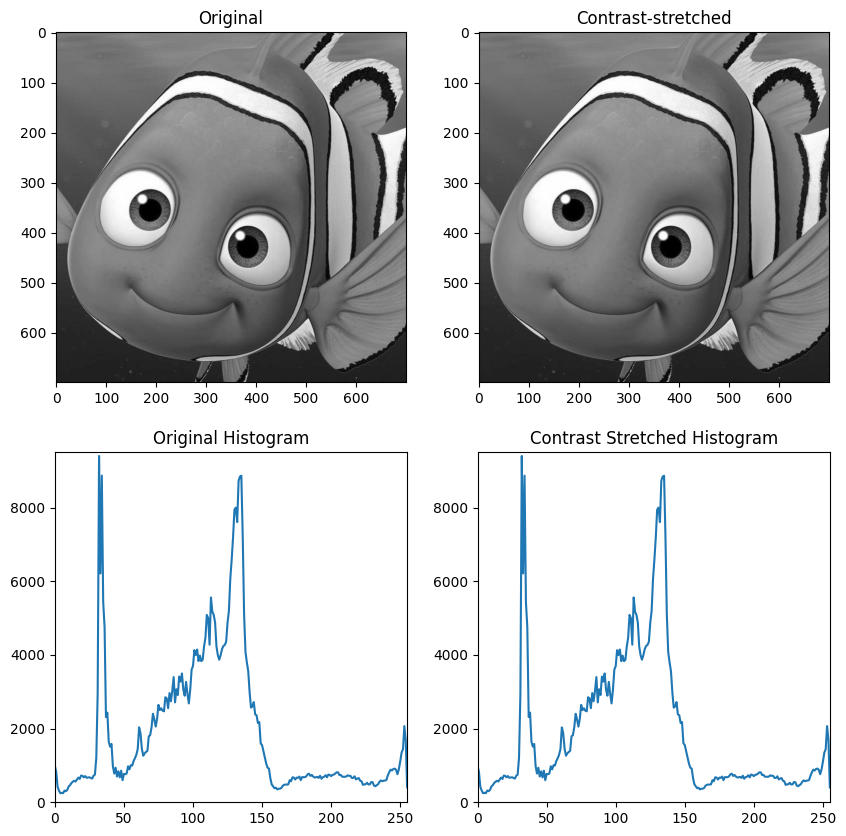

In [ ]:
# Load an image
img = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_GRAYSCALE)

# Calculate the histograms of the original and contrast-stretched images
orig_hist, _ = np.histogram(img, bins=256, range=(0, 255))
stretched_hist, _ = np.histogram(contrast_stretching_gray_image(img, 0, 255, 0, 255), bins=256, range=(0, 255))

# Plot the images and histograms
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

axs[0, 0].imshow(img, cmap='gray')
axs[0, 0].set_title('Original')
# output_img=contrast_stretching_gray_image(img, 50, 200, 0, 255)
axs[0, 1].imshow(contrast_stretching_gray_image(img, 0, 255, 0, 255), cmap='gray')
axs[0, 1].set_title('Contrast-stretched')

axs[1, 0].plot(orig_hist)
axs[1, 0].set_xlim([0, 255])
axs[1, 0].set_ylim([0, max(orig_hist) + 100])
axs[1, 0].set_title('Original Histogram')

axs[1, 1].plot(stretched_hist)
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, max(stretched_hist) + 100])
axs[1, 1].set_title('Contrast Stretched Histogram')

plt.show()

- Nếu điều chỉnh giá trị cường độ tối thiểu về 0 và cường độ tối đa lên 255 thì ảnh tăng cường và ảnh ban đầu về cơ bản là giống nhau, histogram của chúng chứng minh điểu này.

=> Phương pháp Contrast Stretching chỉ có thể hoạt động nếu giá trị cường độ tối thiểu và giá trị cường độ tối đa khác với cường độ tối thiểu và cường độ tối đa tức là giá trị cường độ tối thiểu phải lớn hơn 0 và giá trị cường độ tối đa phải nhỏ hơn 255. Điều này cũng đúng cho trường hợp ảnh màu với 3 kênh màu.


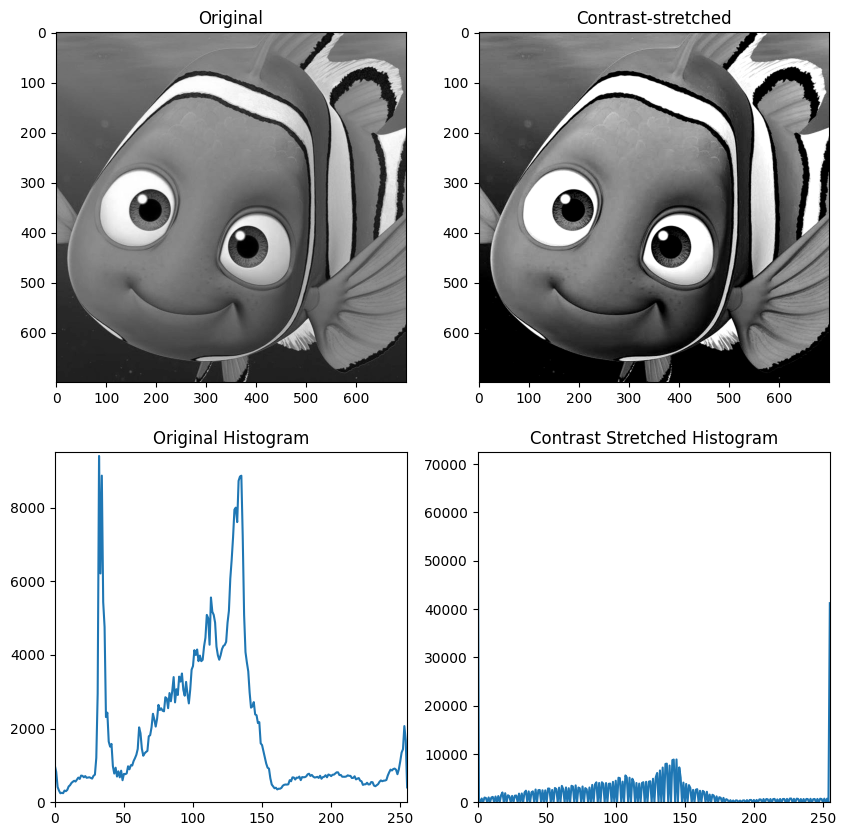

In [ ]:
# Load an image
img = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_GRAYSCALE)

# Calculate the histograms of the original and contrast-stretched images
orig_hist, _ = np.histogram(img, bins=256, range=(0, 255))
stretched_hist, _ = np.histogram(contrast_stretching_gray_image(img, 50, 200, 0, 255), bins=256, range=(0, 255))

# Plot the images and histograms
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

axs[0, 0].imshow(img, cmap='gray')
axs[0, 0].set_title('Original')
output_img=contrast_stretching_gray_image(img, 50, 200, 0, 255)
axs[0, 1].imshow(contrast_stretching_gray_image(img, 50, 200, 0, 255), cmap='gray')
axs[0, 1].set_title('Contrast-stretched')

axs[1, 0].plot(orig_hist)
axs[1, 0].set_xlim([0, 255])
axs[1, 0].set_ylim([0, max(orig_hist) + 100])
axs[1, 0].set_title('Original Histogram')

axs[1, 1].plot(stretched_hist)
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, max(stretched_hist) + 100])
axs[1, 1].set_title('Contrast Stretched Histogram')

plt.show()

- Ở Contrast-stretched Histogram số lượng pixel có cường độ 250 có cao hơn so với Original Histogram, số lượng pixel có cường độ bằng 0 cũng tương tự như vậy. Do đó, ở bức ảnh output, một số vùng tối trở nên tối hơn và một số vùng sáng trở nên sáng hơn => Tăng độ tương phản .ố lượng

- Ngoài ra có thể thấy ở Original Histogram, số pixel mang giá trị từ 25 đến 50 chiếm nhiều nhất, đỉnh cao nhất của đồ thị nằm trong vùng tối nhưng qua Contrast-stretched Histogram thì đỉnh của nó nằm trong khoảng từ 125 đến 150, nằm trong vùng sáng thường, điều này cho thấy ảnh đầu ra sáng hơn so với ảnh ban đầu.

- ///Hình dạng tổng thể Contrast Stretched Histogram có nét tương đồng so với Original Histogram cho thấy Contrast Stretching về cơ bản không làm thay đổi hình dạng tổng thể của histogram như Histogram Equalization nên có thể từ ảnh sau khi tăng cường phục hồi trờ lại ảnh ban đầu.

- Đối với ảnh xám thì không xảy ra trường hợp bị mất thông tin như ảnh màu, phần hốc mắt được làm tối đi để nổi bật so với phần còn lại thay vì làm sáng giống với với phần còn lại ở ảnh màu.

In [ ]:
### TODO 3: Write a essay in English or Vietnamese to evaluate the above result.

### 3. Adaptive histogram equalization

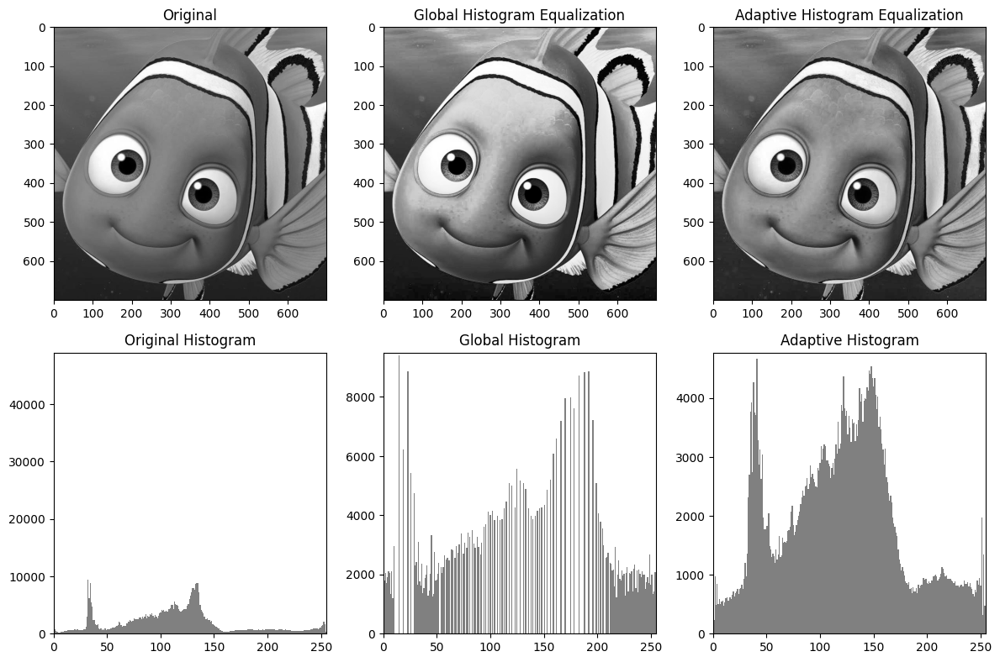

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Load an image in grayscale
img = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_GRAYSCALE)

# Apply global histogram equalization
global_hist_eq = cv2.equalizeHist(img)
global_hist, _ = np.histogram(global_hist_eq, bins=256, range=(0, 255))

# Apply adaptive histogram equalization using CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
adaptive_hist_eq = clahe.apply(img)
adaptive_hist, _ = np.histogram(adaptive_hist_eq, bins=256, range=(0, 255))

# Plot the original, global histogram equalized, and adaptively equalized images and histograms
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

axs[0, 0].imshow(img, cmap='gray')
axs[0, 0].set_title('Original')

axs[0, 1].imshow(global_hist_eq, cmap='gray')
axs[0, 1].set_title('Global Histogram Equalization')

axs[0, 2].imshow(adaptive_hist_eq, cmap='gray')
axs[0, 2].set_title('Adaptive Histogram Equalization')

axs[1, 0].hist(img.flatten(), bins=256, range=(0, 255), color='gray')
axs[1, 0].set_xlim([0, 255])
axs[1, 0].set_ylim([0, img.size/10])
axs[1, 0].set_title('Original Histogram')

axs[1, 1].bar(np.arange(256), global_hist, color='gray', width=1)
axs[1, 1].set_xlim([0, 255])
axs[1, 1].set_ylim([0, global_hist.max()+100])
axs[1, 1].set_title('Global Histogram')

axs[1, 2].bar(np.arange(256), adaptive_hist, color='gray', width=1)
axs[1, 2].set_xlim([0, 255])
axs[1, 2].set_ylim([0, adaptive_hist.max()+100])
axs[1, 2].set_title('Adaptive Histogram')

plt.tight_layout()
plt.show()

- Ở Global Histogram, ta thấy được có một số rãnh trắng trên histogram, đó là các giá trị bị mất đi trong quá trình kéo dãn biểu đồ. Vùng có nhiều rãnh trắng nhất có cường độ nằm từ 50 đến hơn 20 một chút. Đây là vùng nằm giữa vùng sáng và vùng tối của biểu đồ. Nên việc các giá trị cường độ mức xám bị mất trong khoảng này dẫn đến bức ảnh Global Histogram Equalization có màu sắc không được cân đối, sự tiếp giáp giữa vùng ảnh sáng và tối tạo nên các đường viền giữa 2 vùng. Nguyên nhân là do vùng nằm giữa đóng vai trò trung gian cho sự chuyển đổi từ vùng này sang vùng kia bị mất đi khá nhiều các giá trị cường độ.

- Ở Adaptive histogram, ta thấy được đồ thị không có các rãnh nhỏ chứng tỏ không bị bị mất giá trị trong quá trình kéo dãn, từ đó có thể thấy được màu sắc chuyển biến đồng đều hơn so với việc áp dụng phương pháp Global histogram.

- Khi áp dụng phương pháp Global Histogram Equalization thì mức xám của hình ảnh output bị giảm và một số chi tiết biến mất, một số khu vực của ảnh output trở nên quá sáng.

- Khi áp dụng phương pháp Adaptive Histogram Equalization thì có thể thấy chi tiết của ảnh không biến mất đồng thời không có khu vực nào trong ảnh có quá sáng so với các khu vực còn lại đồng thời ảnh không có xuất hiện những đường viền ở ảnh Output so với Global Histogram Equalization 

=>  Nếu khi áp dụng Global Histogram Equalization thì độ sáng của ảnh output thay đổi so với ảnh ban đầu thì khi áp dụng Adaptive histogram thì độ sáng của ảnh sau khi tăng cường được bảo toàn so với ban đầu.



Text(0.5, 1.0, 'Adaptive Equalized Color Image in YUV color space')

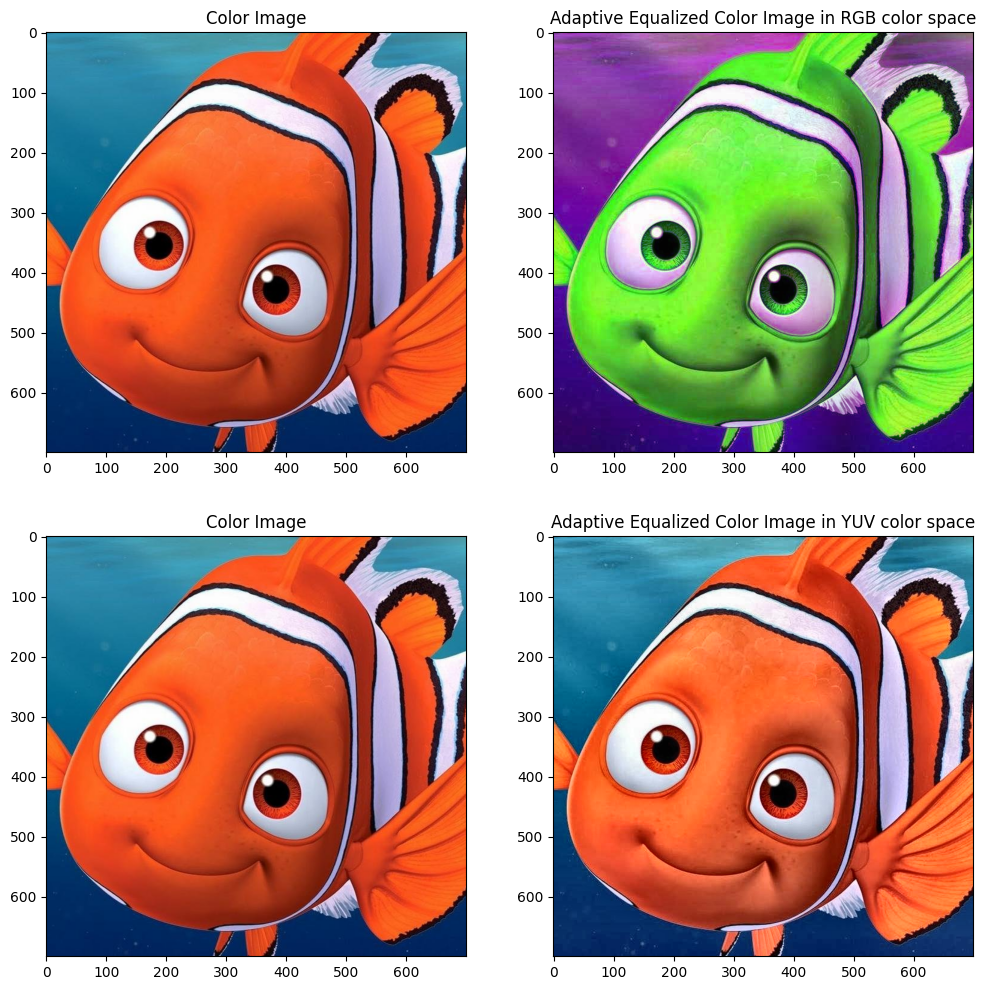

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('DCT1203_3120410256.jpg')
#image = cv2.imread('img.jpg')
# Convert the image to RGB for displaying with Matplotlib

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Color Image')

b, g, r = cv2.split(image)
# # Compute the histograms for each color channel

# Apply adaptive histogram equalization using CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
eq_b = clahe.apply(b)
eq_g = clahe.apply(r)
eq_r = clahe.apply(g)

# # Merge the equalized channels back into a color image
adaptive_equalized_color_img = cv2.merge((eq_b, eq_g, eq_r))
axes[0, 1].imshow(cv2.cvtColor(adaptive_equalized_color_img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Adaptive Equalized Color Image in RGB color space')

color_img = cv2.imread('DCT1203_3120410256.jpg')
#color_img = cv2.imread('img.jpg')
img_yuv = cv2.cvtColor(color_img, cv2.COLOR_BGR2YUV)
img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])

# convert the YUV image back to RGB format
img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

axes[1, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Color Image')
axes[1, 1].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Adaptive Equalized Color Image in YUV color space')

# Split the image into its color channels

- Với trường hợp áp dụng phương pháp Adaptive Histogram Equalization để tăng cường ảnh màu trong không gian màu RGB cũng cho kết quả tương tự như Histogram Equalization khi cho ra ảnh output có sự phối màu không được hợp lý, màu sắc cũng trở nên khác biệt so với ảnh input. Nguyên nhân là do 3 kênh màu cần có sự phối hợp với nhau để hiện thị màu sắc trên 1 bức ảnh nên việc tách ra cân bằng riêng lẻ từng kênh màu làm cho sự phối hợp bị mất đi.

- Chuyển sang không gian màu YUV có chứa kênh biểu thị cho độ sáng và tiến hành cân bằng sáng thì cho ra kết quả khả quan hơn. Bức ảnh sau khi tăng cường giữ được màu sắc của ảnh lúc đầu chưa tăng cường, độ tương phản của ảnh input cũng được nâng lên. 



In [ ]:
### TODO 4: Write a essay in English or Vietnamese to evaluate the above result.

###Compare method

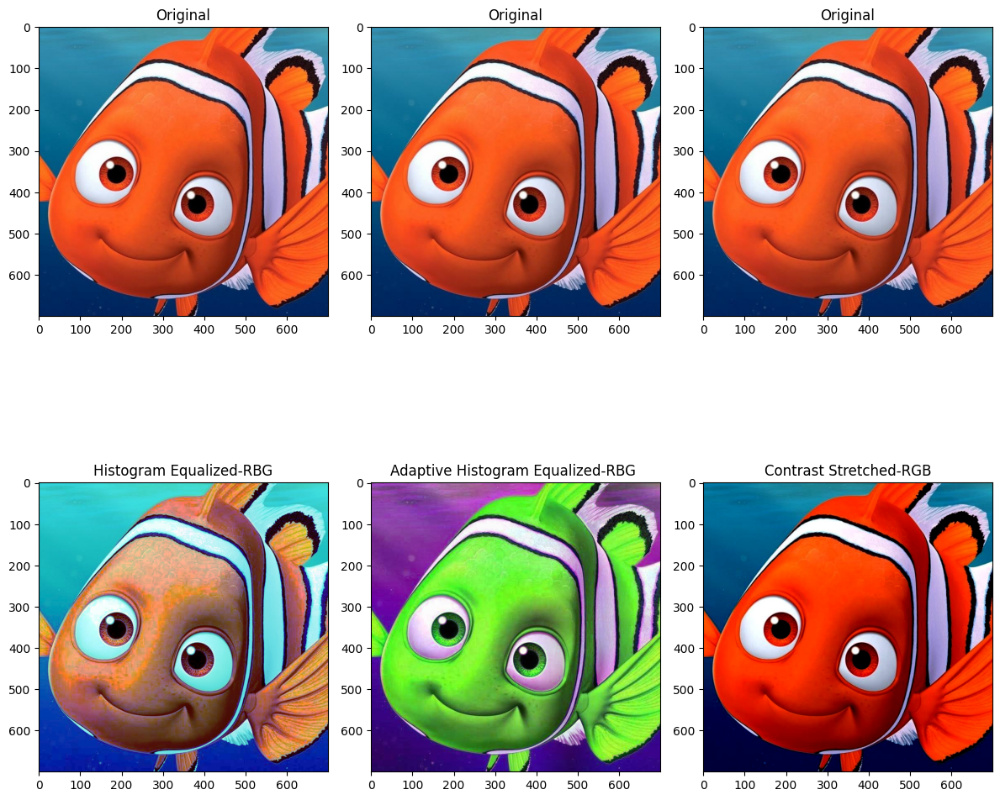

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 12))

axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original')

axes[0, 1].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Original')

axes[0, 2].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title('Original')

axes[1, 0].imshow(cv2.cvtColor(equalized_color_img, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Histogram Equalization-RBG')

axes[1, 1].imshow(cv2.cvtColor(adaptive_equalized_color_img, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Adaptive Histogram Equalization-RBG ')

axes[1, 2].imshow(stretched_img)
axes[1, 2].set_title('Contrast Stretched-RGB')

plt.tight_layout()
plt.show()

- Có thể thấy, phương pháp Contrast Stretching mang lại hiệu quả cao hơn cả 2 phương pháp còn lại, khi cho ảnh đầu ra tuy có màu đậm hơn nhưng màu sắc vẫn tương đồng với ảnh input hơn là hai phương pháp kia.

- Cả 3 kênh màu trong ảnh được tăng cường bằng phương pháp Contrast Stretching đều có sự phối hợp cường độ hợp lý, đồng thời ảnh output cũng có độ tương phản được thể hiện rõ hơn so với ảnh được tăng cường bằng 2 phương pháp còn lại.


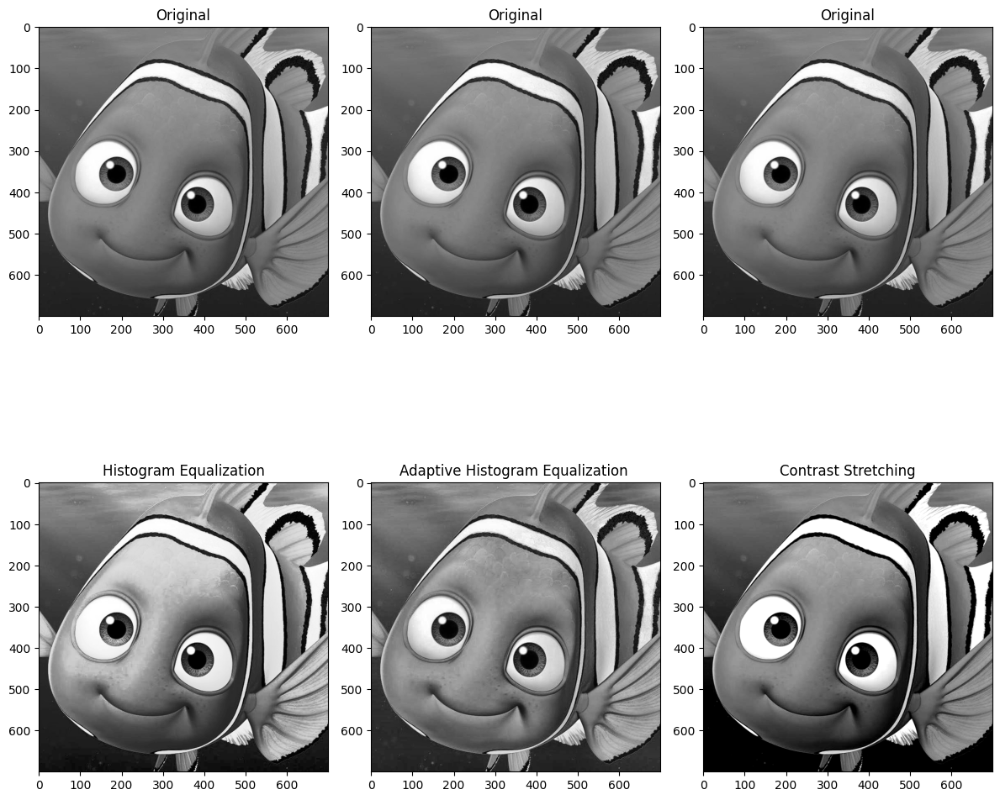

In [ ]:
img = cv2.imread('DCT1203_3120410256.jpg', cv2.IMREAD_GRAYSCALE)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 12))

axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('Original')

axes[0, 1].imshow(img, cmap='gray')
axes[0, 1].set_title('Original')

axes[0, 2].imshow(img, cmap='gray')
axes[0, 2].set_title('Original')

axes[1, 0].imshow(global_hist_eq, cmap='gray')
axes[1, 0].set_title('Histogram Equalization')

axes[1, 1].imshow(adaptive_hist_eq, cmap='gray')
axes[1, 1].set_title('Adaptive Histogram Equalization ')

axes[1, 2].imshow(output_img, cmap='gray')
axes[1, 2].set_title('Contrast Stretching')

plt.tight_layout()
plt.show()

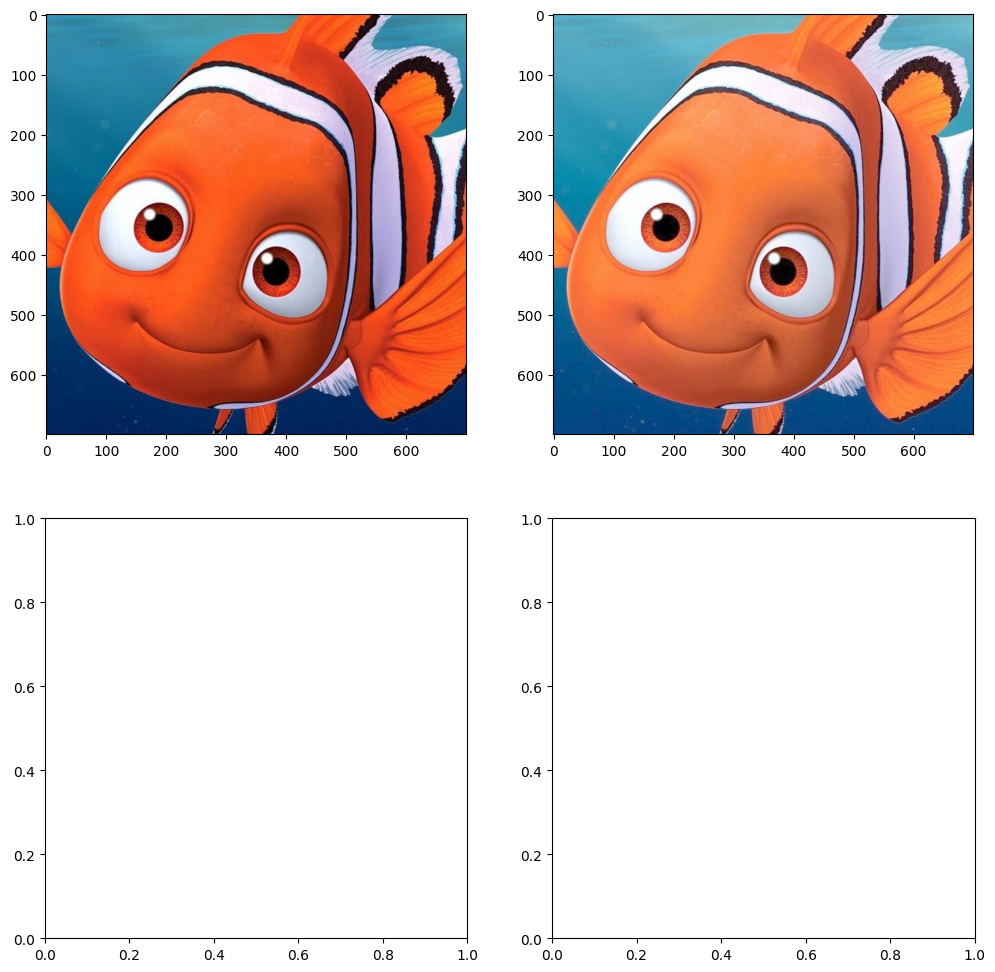

In [ ]:
import cv2
import numpy as np
#from google.colab.patches import cv2_imshow
#import numpy as np
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
def gammaCorrection(src, gamma):
    invGamma = 1 / gamma

    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv2.LUT(src, table)


img = cv2.imread('DCT1203_3120410256.jpg')
gammaImg = gammaCorrection(img, 1.5)

axes[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 1].imshow(cv2.cvtColor(gammaImg, cv2.COLOR_BGR2RGB))
#cv2_imshow(img)
#cv2_imshow(gammaImg)


Trong số ba phương pháp thì:
- Phương pháp Histogram Equalization sau khi tăng cường thì một số khu vực trên ảnh trở nên quá sáng so với các khu vực còn lại.
- Phương pháp Adaptive Histogram Equalization khắc phục được điều này, tuy nhiên độ tương phản giữa các khu vực sáng-tối không được rõ ràng.
- Phương pháp Contrast Stretching thì cho ảnh output có độ tương phản rõ ràng, không có khu vực nào trong ảnh trở nên quá sáng sau khi tăng cường.

=> Phương pháp Contrast Stretching cho kết quả tốt nhất, xếp thứ hai là phương pháp Adaptive Histogram Equalization, cuối cùng là phương pháp Histogram Equalization.


### 4. Conclusion

In [ ]:
### TODO 5: Write a essay in English or Vietnamese to conclude about the above tasks

- Đối với ảnh trên thì phương pháp Contrast Stretching cho kết quả tốt nhất so với 2 phương pháp còn lại trên cả 2 phương diện tăng cường ảnh xám lẫn ảnh màu. Tuy nhiên, trong quá trình tăng cường có thể gây mất thông tin, do đó cần chú ý đến việc điều chỉnh tham số phù hợp. Ngoài ra, phương pháp này chỉ có tác dụng khi ta truyền tham số cho giá trị cường độ tối thiểu phải khác 0 và giá trị cường độ tối đa phải khác 255 nếu không thì bức ảnh output sẽ không có thay đổi nào so với bức ảnh ban đầu.

- Áp dụng phương pháp Histogram Equalization và Adaptive Histogram Equalization để tăng cường ảnh màu trên không gian màu RGB cho kết quả không tốt. Vì 3 kênh màu cần phải có sự phối hợp cường độ hợp lý nên việc cân bằng riêng lẻ từng kênh của Histogram Equalization và Adaptive Histogram Equalization sẽ làm cho mất đi sự phối hợp cường độ của 3 kênh làm cho màu sắc của bức ảnh không được hài hòa. 

- Giải pháp cho việc cân bằng ảnh màu bằng phương pháp Histogram Equalization và Adaptive Histogram Equalization là chuyển đổi không gian màu RGB về không gian màu có kênh màu chứa độ sáng-YUV rồi tiến hành tăng cường kênh màu biểu thị cho độ sáng như trên hoặc có thể lựa chọn chuyển sang các không gian màu có chứa cường độ sáng khác như HSV, YUV, Luv, Lab tùy thuộc vào mỗi bức ảnh.

- Ngoài ra, có thể sử dụng giải pháp khác là áp dụng BRIGHTNESS PRESERVING DYNAMIC HISTOGRAM
EQUALIZATION (BPDHE) thay vì Histogram Equalization thông thường để cân bằng ảnh màu mà với hệ màu RGB.

- So với Contrast Stretching và Adaptive Histogram Equalization thì phương pháp Histogram Equalization làm cho ảnh Output có xu hướng bão hòa cường độ sáng tức là một số khu vực trở nên quá sáng. Một số phương pháp có thể sử dụng để khắc phục cho vấn đề này là Bi-Histogram Equalization (BHE),  Quadrant Dynamic Histogram
Equalization (QDHE),Brightness 
preserving bi-histogram equalization (BBHE),Dualistic sub-image histogram equalization (DSIHE),...